In [1]:
from ac_rl_classes import DataProcessing, AlmgrenChrisModel, AC_UtilityFunction, TradingEnvironment, SimpleLinearCostModel

In [2]:
file_path  = 'xnas-itch-20230703.tbbo.csv'
dp = DataProcessing(file_path, 'AAPL')

In [3]:
temporary_impact_params = {'gamma': 0.0157, 'alpha':1}
permanent_impact_params = {'eta': 0.0157, 'beta': 3/5}
ac_impact_model =AlmgrenChrisModel(temporary_impact_params, permanent_impact_params)
linear_cost_model = SimpleLinearCostModel()

In [4]:
env =TradingEnvironment(dp, ac_impact_model, linear_cost_model, daily_trading_limit= 1000)

In [5]:
import pandas as pd
from stable_baselines3 import PPO

env =TradingEnvironment(dp, ac_impact_model, linear_cost_model, daily_trading_limit= 1000)
best_hyperparameters = {'learning_rate': 0.0009931989008886031,'n_steps': 512,'batch_size': 128, 'gamma': 0.9916829193042708,'clip_range': 0.21127653449387027,'n_epochs': 6} # type: ignore

# Create the RL model with the best hyperparameters
model = PPO('MlpPolicy', env, verbose=1, **best_hyperparameters)

# Train the model
model.learn(total_timesteps=5000)

# Save the model
model.save("trading_agent")

# Evaluate the model
obs = env.reset()
for _ in range(len(dp.data)):
    action, _states = model.predict(obs)
    obs, rewards, done, info = env.step(action)
    if done:
        break

# Render the final state
env.render()

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/Users/cadebruce/anaconda3/envs/vbtpro/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Step: 1, Action: [0.4306068], Shares to trade: [22176.], Reward: [-354.53934]
Step: 2, Action: [-0.34862858], Shares to trade: [-7731.], Reward: [-124.772545]
Step: 3, Action: [1.], Shares to trade: [37039.], Reward: [-590.1803]
Step: 4, Action: [-0.6913011], Shares to trade: [-35591.], Reward: [-567.2422]
Step: 5, Action: [0.25943017], Shares to trade: [9232.], Reward: [-241.03796]
Step: 6, Action: [0.71682924], Shares to trade: [18905.], Reward: [-2949.3037]
Step: 7, Action: [0.27854446], Shares to trade: [2079.], Reward: [-179.72356]
Step: 8, Action: [1.], Shares to trade: [5386.], Reward: [-464.3172]
Step: 9, Action: [-0.8819566], Shares to trade: [-45416.], Reward: [-2539.4653]
Step: 10, Action: [0.41796505], Shares to trade: [18982.], Reward: [-1063.107]
Step: 11, Action: [1.], Shares to trade: [26433.], Reward: [-1215.071]
Step: 12, Action: [-0.29680234], Shares to trade: [-15284.], Reward: [-397.90228]
Step: 13, Action: [-0.6985951], Shares to trade: [-25296.], Reward: [-657.00

# Added Parameter Explanation

I changed the action space to a continuous value \( s \) in the interval \([-1, 1]\) representing order size as a proportion of shares.

- If \( s < 0 \), it represents the proportion of *shares\_held* to (market) sell.

- If \( s > 0 \), it represents the proportion of *(balance/current_price)* to (market) buy.

so the model decides whether to execute in smaller or larger size at each timestep allowing us to break up or consolidate our clients orders if it provides better execution.

## Literature review:

### Paper 1:

The optimal execution problem involves finding the most cost-effective trade schedule $q_t$ given an order size $Q$. The execution price $P_t$ is calculated as:

$P_t = M_t + as \times sign(q_t)$

where $s$ is the bid-ask spread and $a$ is the fraction of the spread we expect to pay.

The paper separates costs into linear cost and impact cost. It introduces time scales $\tau_q$ for trading rate fluctuations and $\tau_M$ for impact delay. They estimate linear cost as:

$\mathbb{E}\left[\Delta C_T / Q\right]=a s+\lambda Q \frac{\operatorname{Var}\left[q_t\right]}{E\left[q_t\right]^2} \frac{\tau_M \tau_q}{\left(\tau_M+\tau_q\right) T}+O\left(\tau^3\right)$

$\operatorname{Var}\left[\Delta C_T / Q\right]=\underbrace{\sigma_M^2 \frac{\operatorname{Var}\left[q_t\right]}{\mathbb{E}\left[q_t\right]^2} \tau_q}_{\text {market noise }}+\underbrace{a^2 s^2 \frac{\operatorname{Var}\left[Q_T\right]}{Q^2}}_{\text {correction for variability of } Q_T}+O\left(\tau^3\right)$.

For price impact, the paper models $I = \Delta M_T = M_T - M_0$ using a weighted integral of price changes:

$I =\int_0^T \pi_t^I dM_t$

with recommended weighting $\pi_t = v \cdot  (q_t - \frac{1}{\tau_M} \int_0^t dse^{-(t-s)/\tau_M}q_s)$ and $v = \frac{\lambda\cdot Q T}{\mathbb{E}[C_{\pi}|q]}$.

The expected impact is then:

$\mathbb{E}\left[I \mid q_{t^{\prime} \in[0, T]}\right]=\lambda Q\left[\frac{\tau_M}{2 T}+\sigma_q^2 \tau_q\left(\frac{1}{2}+\frac{\tau_{\mathrm{eff}}^2}{T \tau_M}-\frac{\tau_{\mathrm{eff}}\left(\tau_M+3 \tau_q\right)}{4 T\left(\tau_M+\tau_q\right)}\right)\right]^{1 / 2}+O\left(e^{-T / \tau}\right)$

### Paper 2:

This paper focuses on estimating the impact cost using the Almgren-Chris family of models. Time $t$ is measured in trading days. The model for the change in mid-price is:

$\Delta M_t = M_t - M_0 = (g(v;\theta) t + h(v;\theta)) + \sigma \int_0^t dW_s$

where $g(v;\theta)$ is the temporary impact function, $h(v;\theta)$ is the permanent impact function, and $W_t$ is a standard Brownian motion.

For power law models within this family:

$g(v;\theta) = \gamma v^{\alpha}$ and $h(v;\theta) = \eta v^{\beta}$

The paper proposes using three points to estimate the impact:

$\boldsymbol{S} = \{\Delta M_{t_1}, \Delta M_{T}, \Delta M_{T_{\text{post}}}\}$ where $t_1/T \leq 1/4$ and $T_{\text{post}} = T + 0.077$ trading days; (ie. 30 minutes)

The parameters $\theta = \{\gamma, \alpha, \beta, \eta\}$ are optimized using:

$\hat{\theta}_{\text{MLE}} = \arg\min_{\theta} \Bigg\{\frac{1}{2\sigma^2} \Big[ 
    \frac{(\Delta M_{t_1} - \gamma v^\alpha t_1 - \eta v^\beta)^2}{t_1}
    + \frac{(\Delta M_T - \Delta M_{t_1} - \gamma v^\alpha (T - t_1))^2}{T - t_1}
    + \frac{(\Delta M_{T_{\text{post}}} - \Delta M_T + \eta v^\beta)^2}{T_{\text{post}} - T} 
\Big] \Bigg\}$ (writing out the expression given in the paper for the three point case).

in the case of VWAP execution.

# Commentary

It looked like our reference implimentation was pointwise rather than scheduling a full trajectory, which is why I didn't use same methods as the linked Almgren Chris github or papers.

# Extra

I started implimenting parameter optimization for the AC model using paper 2; although I realized it was out of the scope of the project. (and the linear impact from paper 1). I include this work below.

In [8]:
data = dp.add_all()

                                                                                         mid_price
ts_event                                                                                          
0E-45                                                                                            0
2.69273504273504273504273504273504272E-10                                                        0
0.000060632231752136752136752136752136752136751  -0.0002317795518928019218662704459203501900860...
0.000225872613076923076923076923076923076923077  -0.0003605459696112366646907058981554577509768...
0.000383879408418803418803418803418803418803419  -0.0004378058202421218418233456149875176323494...


<Axes: xlabel='ts_event'>

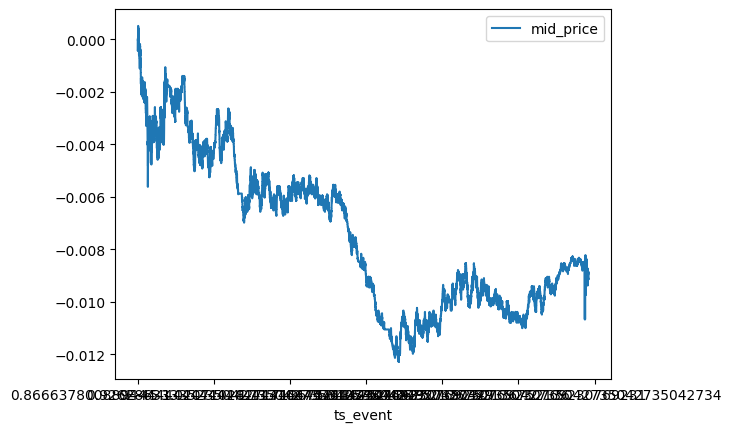

In [15]:
import pandas as pd
from decimal import Decimal, getcontext

# Set the precision high enough for your needs
getcontext().prec = 50

def nanoseconds_to_trading_days_fraction(index):
    # Convert nanoseconds to trading days, assuming 6.5 hours per trading day
    index_hours = index.apply(lambda x: Decimal(x) / Decimal('3.6e+12')) # decimal since we need high precision
    trading_days = index_hours / Decimal('6.5')
    # Calculate the fraction of trading days from the first entry
    fraction_of_days = trading_days - trading_days.iloc[0]
    return fraction_of_days

def get_P(data, current_time, use_midprice= True):
    if use_midprice:
        price = "mid_price" # midprice is better according to paper #1
    else:
        price = "price"
    S = data.set_index('ts_event').loc[current_time:][price].reset_index() 
    S = S.map(lambda x: Decimal(x))
    S['ts_event'] = nanoseconds_to_trading_days_fraction(S['ts_event'])
    S = S.set_index('ts_event')
    P = (S - S.iloc[0]) / S.iloc[0]
    return P

# Example usage
current_time = 1688371214385893078
P = get_P(data, current_time)
print(P.head())
P.map(lambda x: float(x)).plot()

In [16]:
import numpy as np
import pandas as pd
from decimal import Decimal
from scipy.optimize import minimize #, maximize

def closest_index_greater(index, t):
    filtered_index = index[index >= t]
    return Decimal(filtered_index[0])

class AlmgrenChris:
    def __init__(self, T, P):
        self.T = closest_index_greater(P.index, T)
        self.T_post = closest_index_greater(P.index, self.T + Decimal(0.077))
        assert self.T_post >= self.T + Decimal(0.077)
        self.P = P.loc[:self.T_post]
        self.t = self.sample_point()

    def MLE_minimize(self, v, sigma, **kwargs):
        term1 = ((self.P.loc[self.t] - self.permanent_impact(v, **kwargs) * self.t
                  - self.temporary_impact(v, **kwargs))**2) / self.t
        term1 = term1.iloc[0]
        
        term2 = ((self.P.loc[self.T] - self.P.loc[self.t]
                  - self.permanent_impact(v, **kwargs) * (self.T - self.t))**2) / (self.T - self.t)
        term2 = term2.iloc[0]
        
        term3 = (self.P.loc[self.T_post] - self.P.loc[self.T] + self.permanent_impact(v, **kwargs))**2 \
                / (self.T_post - self.T)
        term3 = term3.iloc[0]
        
        return (term1 + term2 + term3) / Decimal((2 * (sigma**2)))

    def sample_point(self, multiplier=0.1):
        max_t = Decimal(0.25) * self.T
        filtered_indexes = self.P.index[self.P.index <= max_t]
        if multiplier is None:
            t = np.random.choice(filtered_indexes[5:])
        else:
            t = self.T * Decimal(multiplier)
        
        t = closest_index_greater(self.P.index, t)
        assert (t in filtered_indexes)
        return t

    def temporary_impact(self, v, **kwargs):
        raise NotImplementedError("This method should be overridden by subclasses")

    def permanent_impact(self, v, **kwargs):
        raise NotImplementedError("This method should be overridden by subclasses")

class PowerLawImpactModel(AlmgrenChris):
    def __init__(self, T, P, alpha, beta, gamma, eta):
        super().__init__(T, P)
        self.gamma = gamma
        self.eta = eta
        self.alpha = alpha
        self.beta = beta

    def permanent_impact(self, v, **kwargs):
        alpha = kwargs['alpha']
        gamma = kwargs['gamma']
        return Decimal(gamma * v ** alpha)

    def temporary_impact(self, v, **kwargs):
        beta = kwargs['beta']
        eta = kwargs['eta']
        return Decimal(eta * v ** beta)

class StockPowerLawModel(PowerLawImpactModel):
    def __init__(self, T, P, alpha, beta, avg_daily_volume, shares_outstanding, sigma, gamma_a, eta_a):
        inverse_turnover = abs(shares_outstanding / avg_daily_volume)
        gamma = sigma * gamma_a * (inverse_turnover ** gamma_a)
        eta = sigma * eta_a
        super().__init__(T, P, alpha, beta, gamma, eta)
        self.vwap_v = inverse_turnover

# Define your function to optimize
def get_log_likelihood(theta, alpha, beta, T, P, sigma, avg_daily_volume, shares_outstanding, v):
    gamma_a, eta_a = theta
    print(f"Optimizing with gamma_a: {gamma_a}, eta_a: {eta_a}, alpha: {alpha}, beta: {beta}")
    model = StockPowerLawModel(T, P, alpha, beta, avg_daily_volume, shares_outstanding, sigma, gamma_a, eta_a)
    kwargs = {'alpha': alpha, 'beta': beta, 'gamma': model.gamma, 'eta': model.eta}
    if v is None:
        v = model.vwap_v
    result = model.MLE_minimize(v=v, sigma=sigma, **kwargs)
    print("Log Likelihood", result)
    return float(result.iloc[0])

T = .5
alpha = 1
beta = 3/5
gamma_a = 0.0157
eta_a = 0.0157
sigma = 0.2
shares_outstanding = 1e8
avg_daily_volume = shares_outstanding * 20
v = 1e10
initial_theta = [gamma_a, eta_a]
bounds = [(0, 1), (0, 1)]
result = minimize(get_log_likelihood, initial_theta, args=(alpha, beta, T, P, sigma, avg_daily_volume, shares_outstanding, v), bounds=bounds, method='Nelder-Mead')
optimized_theta = result.x
optimized_log_likelihood = result.fun


# I had bad fits for varying alpha and beta, so I leave those constant and just fit gamma, eta
# Also alpha= 1 prevents unrealistic arbitrage, it might be ok to optimize beta
[o_gamma_a, o_eta_a] = optimized_theta
model = StockPowerLawModel(T, P, alpha, beta, avg_daily_volume, shares_outstanding, sigma, o_gamma_a, o_eta_a)
kwargs = {'alpha': alpha, 'beta': beta, 'gamma': model.gamma, 'eta': model.eta}
if v is None:
    v = model.vwap_v
temp_impact = model.temporary_impact(v=v, **kwargs)
perm_impact = model.permanent_impact(v=v, **kwargs)
print(f"Optimized Parameters: gamma_a={o_gamma_a}, eta_a={o_eta_a}")
print(f"Temporary Impact: {temp_impact}, Permanent Impact: {perm_impact}")
print(f"Optimized Log Likelihood: {optimized_log_likelihood}")


Optimizing with gamma_a: 0.0157, eta_a: 0.0157, alpha: 1, beta: 0.6
Log Likelihood mid_price    151185247355191842.480018962437822998297358380...
Name: 0.577277454777564102564102564102564102564102563, dtype: object
Optimizing with gamma_a: 0.016485, eta_a: 0.0157, alpha: 1, beta: 0.6
Log Likelihood mid_price    165899504422472968.677321081796444409886407595...
Name: 0.577277454777564102564102564102564102564102563, dtype: object
Optimizing with gamma_a: 0.0157, eta_a: 0.016485, alpha: 1, beta: 0.6
Log Likelihood mid_price    151185365189526042.450901903913843829322669842...
Name: 0.577277454777564102564102564102564102564102563, dtype: object
Optimizing with gamma_a: 0.014914999999999998, eta_a: 0.016485, alpha: 1, beta: 0.6
Log Likelihood mid_price    137088156905597736.840013518614881172643058173...
Name: 0.577277454777564102564102564102564102564102563, dtype: object
Optimizing with gamma_a: 0.014129999999999997, eta_a: 0.016877500000000004, alpha: 1, beta: 0.6
Log Likelihood mid_price